# HuBMAP + HPA competition - Some preliminary EDA
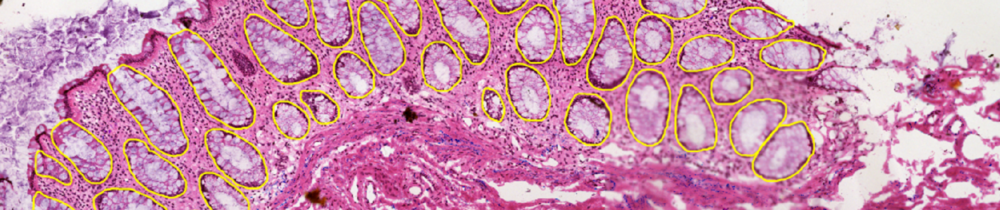

## Introduction and goals of the competition
This kaggle competition, is about identifying and segment functional tissue units (FTUs) across five human organs. A dataset of tissue section images is provided and the goal is to create a model that has the best accuracy in segmenting those FTUs.

For more detailed information: __[HuBMAP + HPA - Hacking the body competition](https://www.kaggle.com/competitions/hubmap-organ-segmentation/overview)__ 

In [36]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import tifffile

In [37]:
# plt.style.available
plt.style.use("seaborn")

INPUT_PATH = '/kaggle/input/hubmap-organ-segmentation'
train_images_path = os.path.join(INPUT_PATH, 'train_images')
test_images_path = os.path.join(INPUT_PATH,'test_images')

## Meta-data
Firstly, we are going to explore the meta-data of the datasets provided by the competition. 

### The training set

In [38]:
df = pd.read_csv(os.path.join(INPUT_PATH, 'train.csv'))
df.sample(5)

,id,organ,data_source,img_height,img_width,pixel_size,tissue_thickness,rle,age,sex
82,17422,kidney,HPA,3000,3000,0.4,4,4571065 19 4574057 33 4577055 37 4580050 47 45...,59.0,Male
187,27232,lung,HPA,3000,3000,0.4,4,1754231 15 1757231 16 1760229 18 1763227 21 17...,43.0,Female
120,21086,prostate,HPA,3000,3000,0.4,4,760443 32 763442 34 766442 34 769419 121 77241...,55.0,Male
314,7359,lung,HPA,3000,3000,0.4,4,4020786 16 4023785 22 4026784 27 4029782 31 40...,43.0,Female
108,20302,kidney,HPA,3000,3000,0.4,4,733494 80 736492 86 739489 93 742482 139 74547...,70.0,Male


In [39]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 351 entries, 0 to 350
Data columns (total 10 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   id                351 non-null    int64  
 1   organ             351 non-null    object 
 2   data_source       351 non-null    object 
 3   img_height        351 non-null    int64  
 4   img_width         351 non-null    int64  
 5   pixel_size        351 non-null    float64
 6   tissue_thickness  351 non-null    int64  
 7   rle               351 non-null    object 
 8   age               351 non-null    float64
 9   sex               351 non-null    object 
dtypes: float64(2), int64(4), object(4)
memory usage: 27.5+ KB


In the training set, we have 351 images of 5 different organs. Let's see the distribution of images based on the different organs.

kidney            99
prostate          93
largeintestine    58
spleen            53
lung              48
Name: organ, dtype: int64


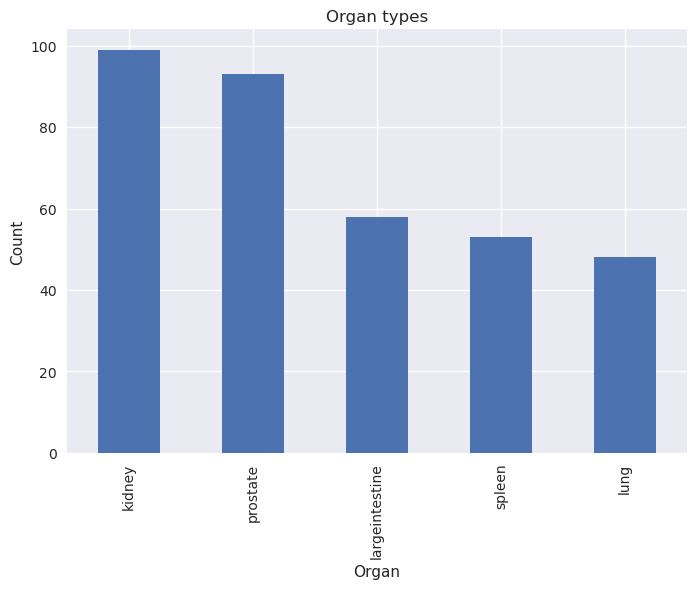

In [40]:
print(df['organ'].value_counts())
df['organ'].value_counts().plot(kind='bar', title='Organ types', xlabel='Organ', ylabel='Count')
plt.show()

The images were taken from both genders, but most images are from males.

Male      229
Female    122
Name: sex, dtype: int64


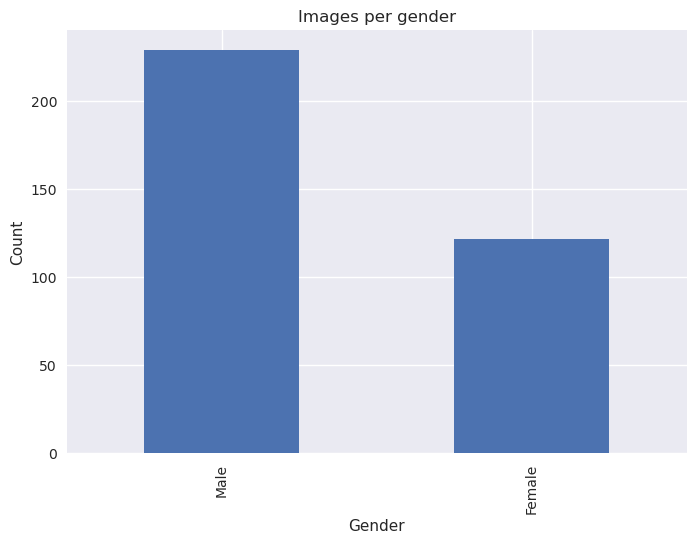

In [41]:
print(df['sex'].value_counts())
df['sex'].value_counts().plot(kind='bar', title='Images per gender', xlabel='Gender', ylabel='Count')
plt.show()

The distribution of the various ages is as follows: 

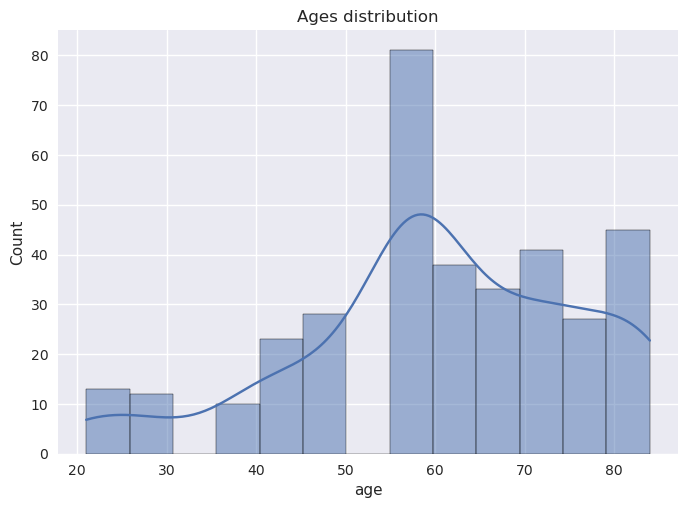

In [42]:
sns.histplot(x='age', kde=True, data=df).set_title("Ages distribution")
plt.show()

And the ages by gender follow.

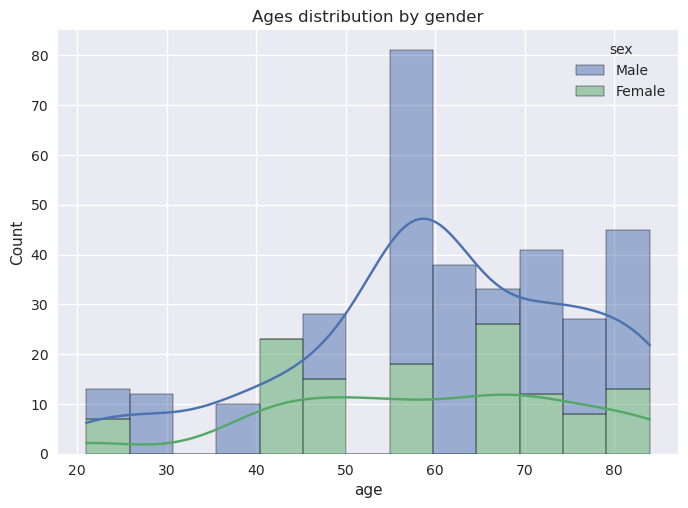

In [43]:
sns.histplot(data=df, x='age', kde=True, hue='sex', multiple="stack").set_title("Ages distribution by gender")
plt.show()

### Test dataset
The test data set is comprised by only **one** image and its data source is **HuBMAP**. More information about the images of the hidden test set can be found in the [test set images section](#test-set) of this notebook.

In [44]:
df_test = pd.read_csv(os.path.join(INPUT_PATH, 'test.csv'))
df_test.head()

,id,organ,data_source,img_height,img_width,pixel_size,tissue_thickness
0,10078,spleen,Hubmap,2023,2023,0.4945,4


## Images of the dataset

## Train images

We notice that all images come from the same source (HPA)

In [45]:
# Sources of the dataset images
print(df['data_source'].unique())

['HPA']


We also notice that the images have various resolutions and they all are quite high.  
However, most of the images (326) have a 3000x3000 resolution.

In [46]:
print("All images are square : ", df['img_height'].equals(df['img_width']))
min_res = df['img_height'].unique().min()
max_res = df['img_height'].unique().max()
print(f"Minimum resolution: {min_res} x {min_res}")
print(f"Maximum resolution: {max_res} x {max_res}")
agg_res = df.groupby(['img_height', 'img_width']).agg({'img_height': 'count'})
agg_res.columns = agg_res.columns.map('_'.join)
dc = {'i_m_g___h_e_i_g_h_t':'count'}
agg_res = agg_res.rename(columns=dc).reset_index()
agg_res

All images are square :  True
Minimum resolution: 2308 x 2308
Maximum resolution: 3070 x 3070


,img_height,img_width,count
0,2308,2308,1
1,2416,2416,2
2,2511,2511,1
3,2539,2539,1
4,2593,2593,1
5,2630,2630,1
6,2631,2631,2
7,2654,2654,2
8,2675,2675,1
9,2680,2680,1


And the counts of every resolution is depicted in the following graph.

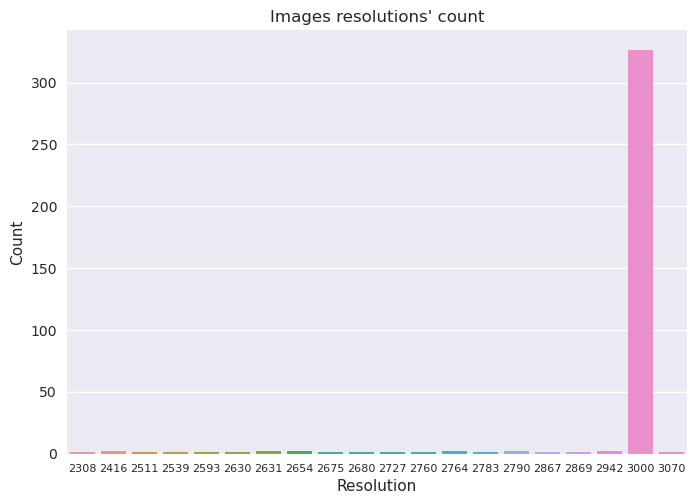

In [47]:
# sns.barplot(data=agg_res, x='img_height', y='count')
ax = sns.countplot(data=df, x='img_height')
ax.set_title("Images resolutions' count")
ax.tick_params(axis='x', which='major', labelsize=8)
plt.xlabel('Resolution')
plt.ylabel('Count')
plt.show()

### Mask area per image distributions

In [48]:
def calc_area(rle):
    # Agregate all lengths of consecutive pixels of the mask 
    lengths = list(map(int, rle.split(' ')[1::2]))
    
    return np.sum(lengths).astype(int)

df['mask_area'] = df['rle'].map(calc_area)
df['mask_percent'] = 100*df['mask_area']/(df['img_height'] * df['img_width'])
df[['id','organ', 'img_height', 'img_width', 'mask_area', 'mask_percent']].head(5)

,id,organ,img_height,img_width,mask_area,mask_percent
0,10044,prostate,3000,3000,1340068,14.889644
1,10274,prostate,3000,3000,1458107,16.201189
2,10392,spleen,3000,3000,790411,8.782344
3,10488,lung,3000,3000,46171,0.513011
4,10610,spleen,3000,3000,439839,4.887100


In [49]:
print(f"Number of empty masks: {len(df[df['mask_area']==0])}")
print(f"Number of non-empy masks: {len(df[df['mask_area'] > 0])}")
print(df['mask_percent'].describe())

Number of empty masks: 0
Number of non-empy masks: 351
count    351.000000
mean       9.937410
std        9.229088
min        0.072989
25%        2.688250
50%        5.906389
75%       16.729338
max       42.933189
Name: mask_percent, dtype: float64


We have only non-zero masks in this dataset. Let's see the distribution of the percentages of the area that the mask occupies in every image.

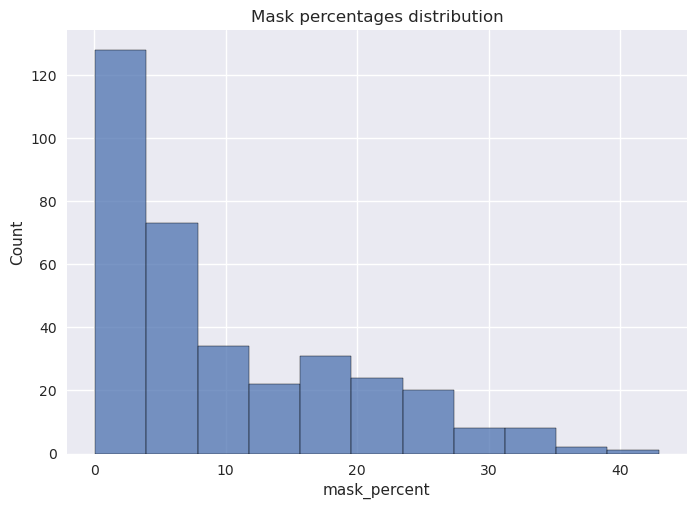

In [50]:
sns.histplot(x='mask_percent', data=df).set_title("Mask percentages distribution")
plt.show()

We observe that most masks have a very low coverage of the image < 10%

Let's see what this distribution is for every different organ 

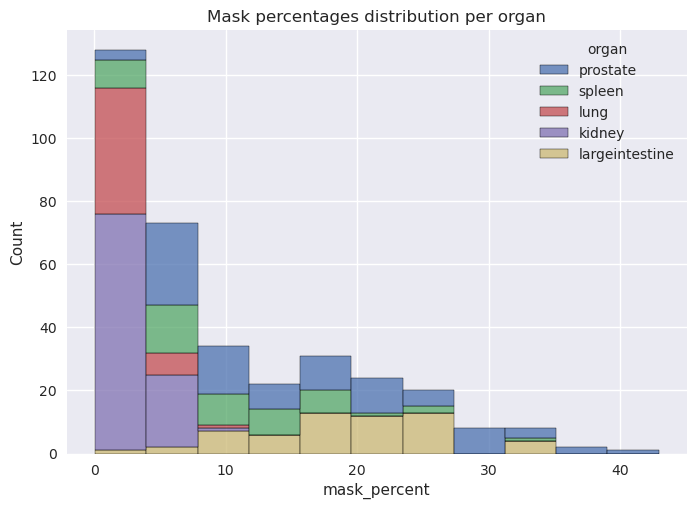

In [51]:
sns.histplot(x='mask_percent', hue='organ', multiple="stack", data=df).set_title("Mask percentages distribution per organ")
# sns.displot(x='mask_percent', hue='organ', kind='kde', multiple='stack', data=df)
plt.show()

Lung and kindey images have the lower mask coverage.

### Plotting samples of images and their respective masks

In [52]:
def rle2mask(mask_rle, shape):
    '''
    mask_rle: run-length as string formated (start length)
    shape: (width,height) of array to return
    Returns numpy array, 1 - mask, 0 - background
    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0]*shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T

In [53]:
def read_image(image_id, scale=None):
    image = tifffile.imread(
        os.path.join(train_images_path, f"{image_id}.tiff"))
    if len(image.shape) == 5:
        image = image.squeeze().transpose(1, 2, 0)
    mask = rle2mask(
        df[df.id == image_id]["rle"].values[0], 
        (image.shape[1], image.shape[0]))
    if scale:
        new_size = (image.shape[1] // scale, image.shape[0] // scale)
        image = cv2.resize(image, new_size)
        mask = cv2.resize(mask, new_size)
        
    return image, mask

In [54]:
def display_samples(sample_ids, title=True):
    plt.figure(figsize=(16, 16))
    for ind, img_id in enumerate(sample_ids):
        ax = plt.subplot(3, 3, ind + 1)
        image, mask = read_image(img_id, scale=5)
        plt.imshow(image)
        plt.imshow(mask, cmap="BrBG", alpha=0.5)
        if title:
            plt.title(df[df.id == img_id]['organ'].item())
        plt.axis("off")

Some sample images of the whole dataset.

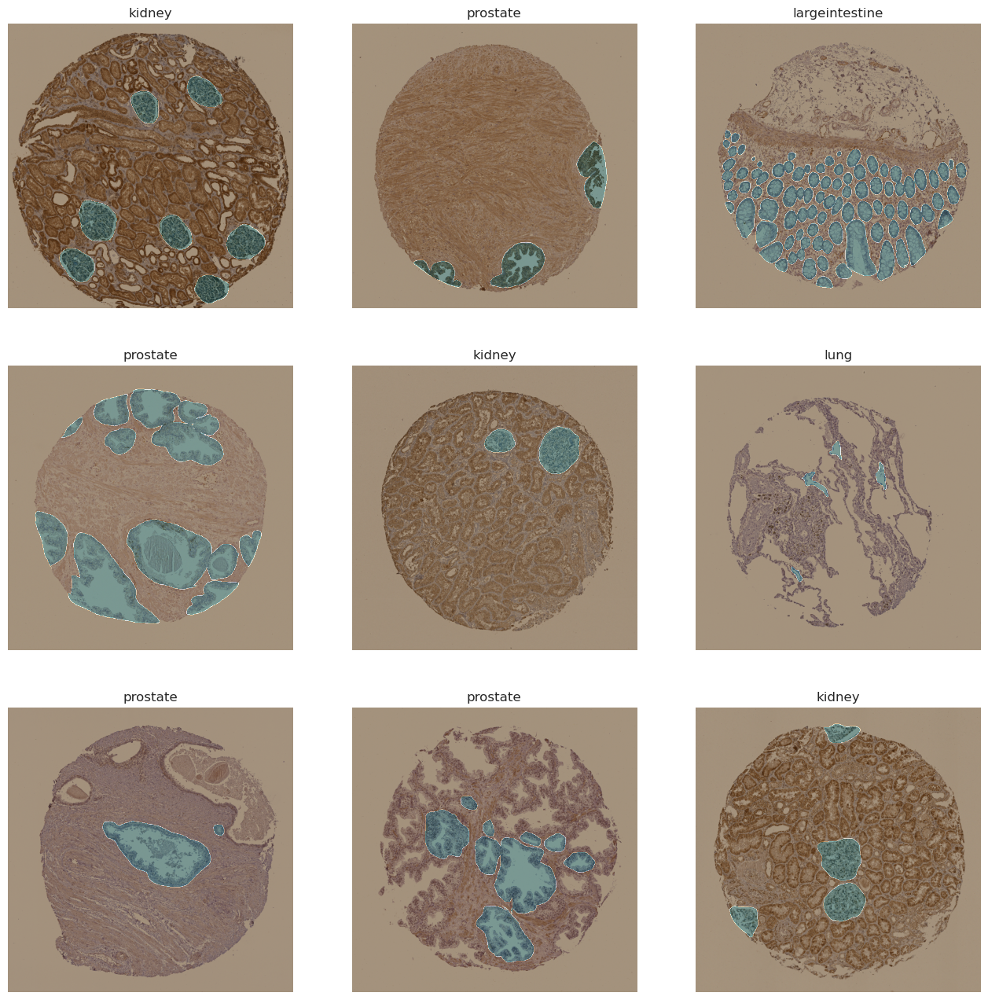

In [55]:
# Take random pictures and display them
sample_ids = list(df.sample(9, random_state=1)['id'])
display_samples(sample_ids)

### Sample images per organ
We will see some samples per organ to get a better understanding of every different category.

### Kidney

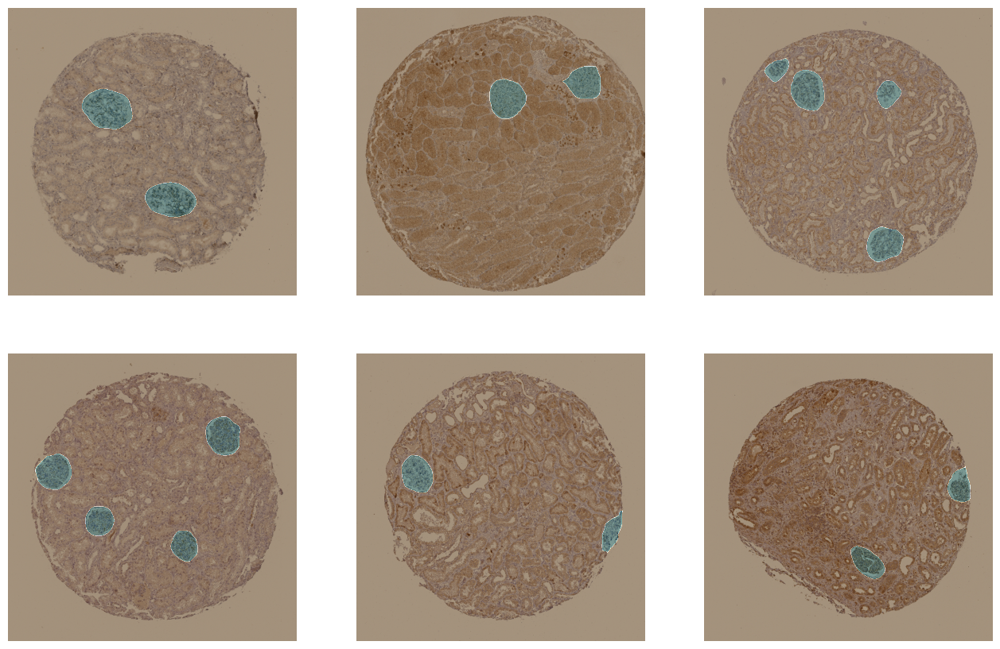

In [56]:
sample_ids = list(df[df.organ == 'kidney'].sample(6, random_state=1)['id'])
display_samples(sample_ids, title=False)

#### Prostate

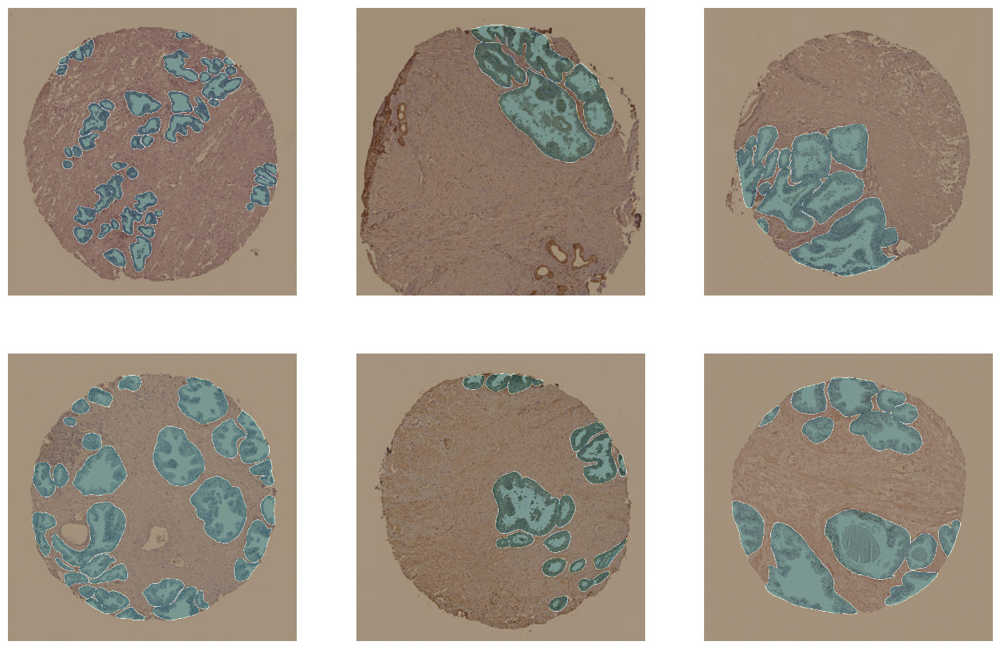

In [57]:
sample_ids = list(df[df.organ == 'prostate'].sample(6, random_state=1)['id'])
display_samples(sample_ids, title=False)

#### Large Intestine

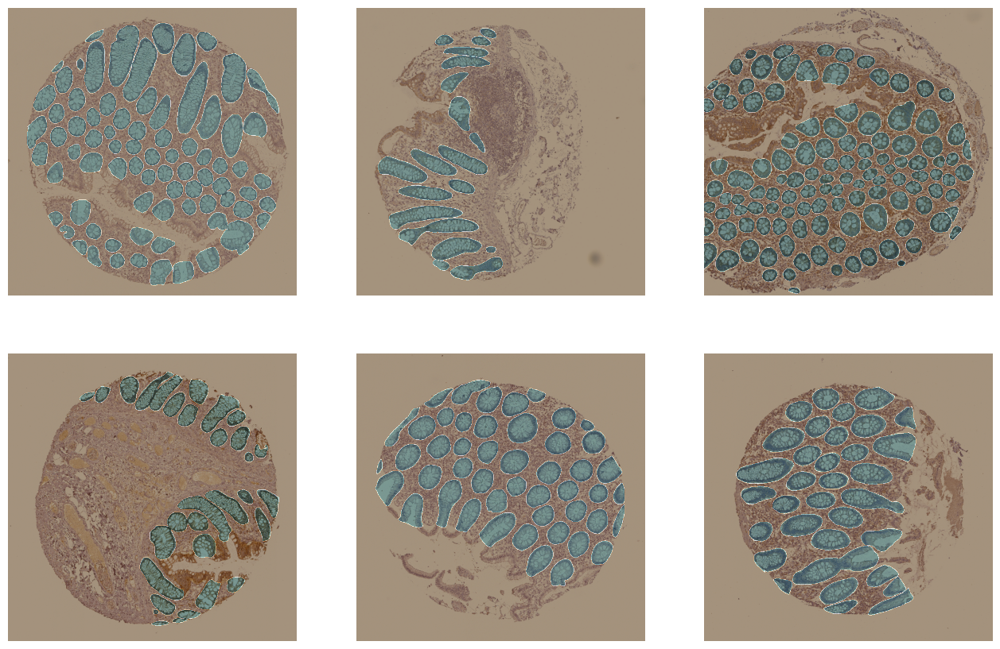

In [58]:
sample_ids = list(df[df.organ == 'largeintestine'].sample(6, random_state=1)['id'])
display_samples(sample_ids, title=False)

#### Spleen

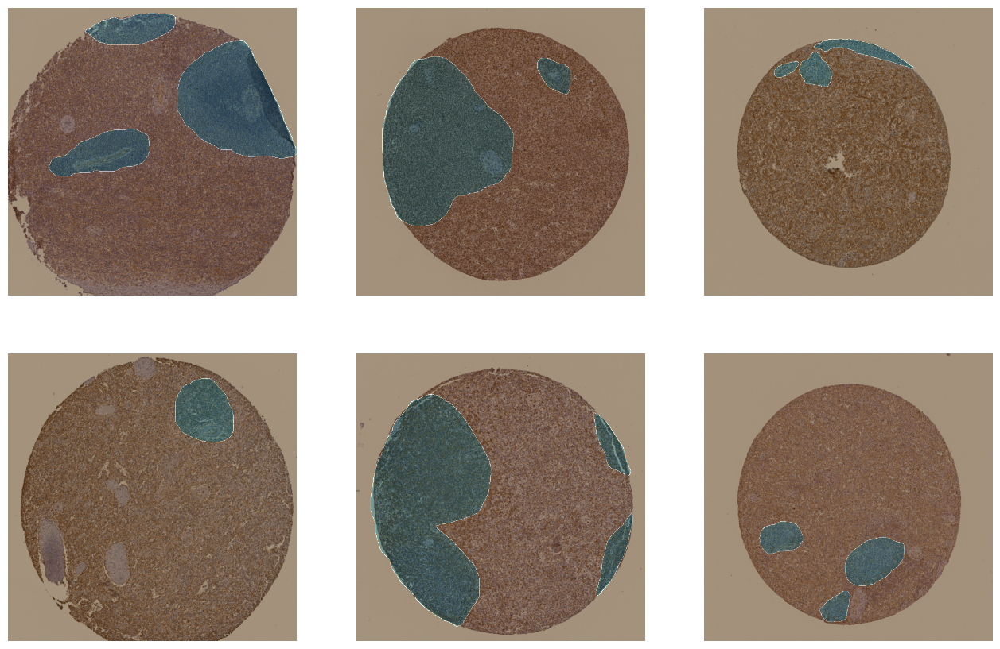

In [59]:
sample_ids = list(df[df.organ == 'spleen'].sample(6, random_state=1)['id'])
display_samples(sample_ids, title=False)

#### Lung

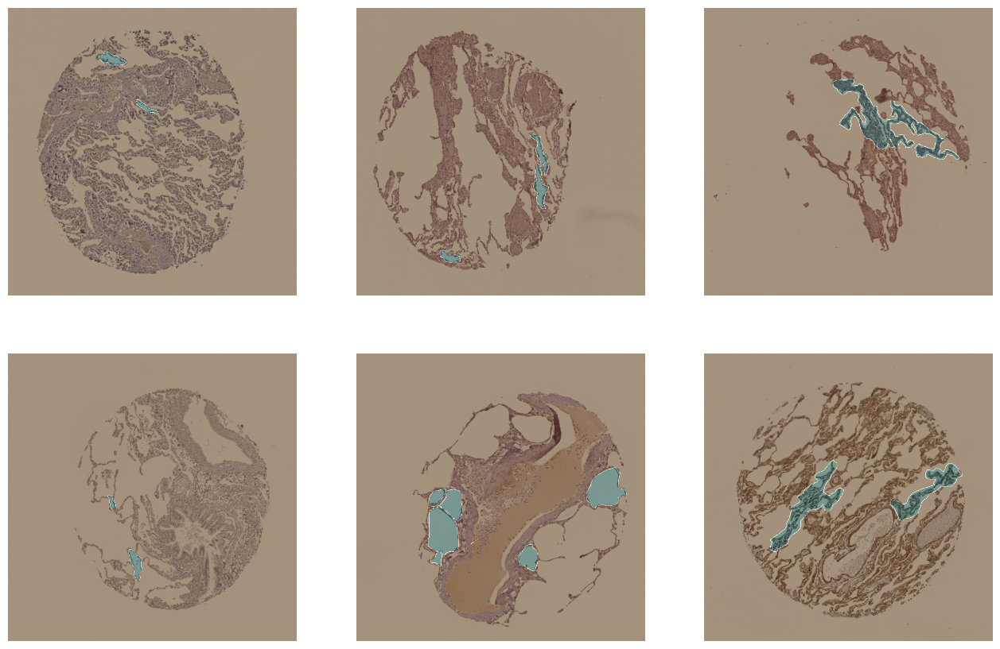

In [60]:
sample_ids = list(df[df.organ == 'lung'].sample(6, random_state=2)['id'])
display_samples(sample_ids, title=False)

### <a name="test-set"></a>Test set
According to the organizers, we should expect around 550 images in the hidden test set for the evaluation of the models. 50% of them will be used for the public score in the Leaderboard and 50% will be hidden until after the closing date of the competition. 
All of them will come from the same **HuBMAP** data source with resolutions ranging from 4500x4500 down to 160x160 pixels. We have only **HPA** images for training. Furthermore HPA and HuBMAP use different techniques for staining. So the main objective of the trained models should be to generalize as much as possible, especially with images that probably look quite differently. If they don't, we expect to see great differences between the accuracy of the training and the inference. Downloading an external dataset with HuBMAP images and incorporating it in the training dataset, could be a good idea.    
We should expect only non-zero masks predictions by the models as the competition explicitly states that all images used have at least one FTU.  
   
Let's see how a sample HuBMAP test image from a spleen looks like: 

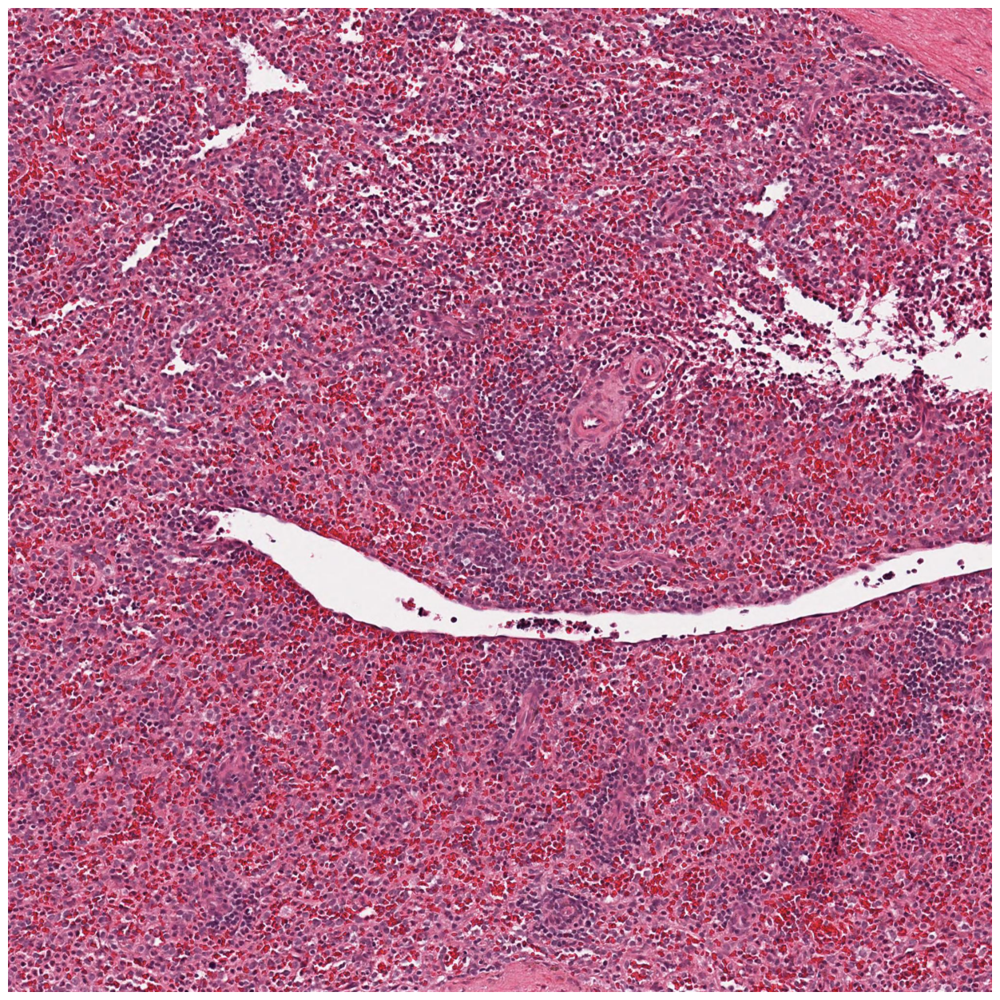

In [61]:
plt.figure(figsize=(16, 16))
image = tifffile.imread(os.path.join(test_images_path, f"{df_test['id'].values[0]}.tiff"))
plt.imshow(image)
plt.axis('off');